# Sangkak AI Challenge: POS tasks
-------------------------------------------------------

- **Author**: Elvis MBONING (NTeALan Research and Development Team)
- **Session**: septembre 2023

----------------------------------------------------------------

In this notebook, we try to train differents models.

We want to train these hypothesis for CRF_suite and Xgboost model:

- impact of features normalization to the model classification
- impact of features regulatization to the model classification
- impact of choice of classification algorithm to the model classification
- impact of data augmentation based on position (imbalence classes) to the model classification
- impact of data augmentation based on features (imbalence classes) to the model classification



# 1. Impact of features normalization to the model classification


In [2]:
from sangkak_estimators import SangkakPosProjetReader, SangkakPosFeaturisation

### 1.1. Case of Xgboost model

In [1]:
# Install python packages dependencies (if not already installed)
# version=xgboost-1.7.6
!pip3 install xgboost -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.3/200.3 MB 12.4 MB/s eta 0:00:0000:0100:01


In [3]:
import pandas as pd
from pathlib import Path
import xgboost as xgb

In [4]:
# Get path of test data 
language = 'bbj'
bbj_pos_path   = Path(f'../data_source/masakhane-pos/data/{language}')
train_data_path = bbj_pos_path / 'train.txt'
dev_data_path = bbj_pos_path / 'dev.txt'
test_data_path = bbj_pos_path / 'test.txt'

# read data from source with sklearn estimator
reader_estimator = SangkakPosProjetReader()
list_train_data, pd_train_data = reader_estimator.fit(train_data_path).transform_analysis()
list_dev_data, pd_dev_data = reader_estimator.fit(dev_data_path).transform_analysis()
list_test_data, pd_test_data = reader_estimator.fit(test_data_path).transform_analysis()

pd_train_data

12347 12347 12347
2447 2447 2447
9315 9315 9315


,sentence_id,word,tags
0,1,Mwɔ̌ʼ,NOUN
1,1,pfʉ́tə́,VERB
2,1,nə́,ADP
3,1,mwâsi,NOUN
4,1,máp,DET
...,...,...,...
12342,751,kə,AUX
12343,751,fǎʼ,VERB
12344,751,nə́,ADP
12345,751,é,PRON


In [5]:
feature_estimator = SangkakPosFeaturisation()
feature_estimator.fit([])

Xtrain = feature_estimator.transform(list_train_data)
Xdev  = feature_estimator.transform(list_dev_data)
Xtest = feature_estimator.transform(list_test_data)

ytrain = feature_estimator.transform(list_train_data, label=True)
ydev   = feature_estimator.transform(list_dev_data, label=True)
ytest  = feature_estimator.transform(list_test_data, label=True)

Xtrain

[[{'word': 'Mwɔ̌ʼ',
   'word.tones': '̌',
   'word.normalized': 'Mwɔ̌ʼ',
   'word.position': 0,
   'word.has_hyphen': 0,
   'word.lower()': 'mwɔ̌ʼ',
   'word.start_with_capital': -1,
   'word.have_tone': 1,
   'word.prefix': 'Mw',
   'word.root': '̌ʼ',
   'word.ispunctuation': 0,
   'word.isdigit()': 0,
   'word.EOS': 0,
   'word.BOS': 1,
   '-1:word': '',
   '-1:word.position': -1,
   '-1:word.tag': '',
   '-1:word.normalized': '',
   '-1:word.start_with_capital': -1,
   '-1:len(word-1)': -1,
   '-1:word.lower()': '',
   '-1:word.isdigit()': -1,
   '-1:word.ispunctuation': 0,
   '-1:word.BOS': 0,
   '-1:word.EOS': 0,
   '+1:word': 'pfʉ́tə́',
   '+1:word.tag': 'VERB',
   '+1:word.position': 1,
   '+1:word.normalized': 'pfʉ́tə́',
   '+1:word.start_with_capital': 0,
   '+1:len(word+1)': 7,
   '+1:word.lower()': 'pfʉ́tə́',
   '+1:word.isdigit()': 0,
   '+1:word.ispunctuation': 0,
   '+1:word.BOS': 0,
   '+1:word.EOS': 0},
  {'word': 'pfʉ́tə́',
   'word.tones': '',
   'word.normalized': 'p

In [6]:
features_types = {
    "categorical_features": [
        'word',
        'word.tones',
        'word.normalized',
        'word.lower()',
        'word.prefix',
        'word.root',
        '-1:word',
        '-1:word.tag',
        '-1:word.normalized',
        '-1:word.lower()',
        '+1:word',
        '+1:word.lower()',
        '+1:word.tag',
        '+1:word.normalized'
    ],
    "numerical_features": [
        'word.position',
        '-1:word.position',
        '-1:word.start_with_capital',
        '-1:len(word-1)',
        '+1:word.position',
        'word.start_with_capital',
        'word.has_hyphen',
        '+1:word.start_with_capital',
        '+1:len(word+1)',
        '+1:word.isdigit()',
        '+1:word.ispunctuation',
        '+1:word.BOS',
        '+1:word.EOS',
        '-1:word.isdigit()',
        '-1:word.ispunctuation',
        '-1:word.BOS',
        '-1:word.EOS',
        'word.have_tone',
        'word.ispunctuation',
        'word.isdigit()',
        'word.EOS',
        'word.BOS'
    ]
}

xgb_df_train = feature_estimator.transform_to_sagemaker_format(
    Xtrain, ytrain,
    normalize=features_types
)
xgb_df_dev = feature_estimator.transform_to_sagemaker_format(
    Xdev, ydev, 
    label='dev',
    normalize=features_types
)
xgb_df_test = feature_estimator.transform_to_sagemaker_format(
    Xtest, ytest, 
    label='test',
    normalize=features_types
)

[train] Building sagemaker data for classification
[dev] Building sagemaker data for classification
[test] Building sagemaker data for classification


In [7]:
xgb_X_train = pd.get_dummies(xgb_df_train[xgb_df_train.columns[1:]])
xgb_y_train = pd.get_dummies(xgb_df_train[xgb_df_train.columns[0]])

xgb_X_dev = pd.get_dummies(xgb_df_dev[xgb_df_dev.columns[1:]])
xgb_y_dev = pd.get_dummies(xgb_df_dev[xgb_df_dev.columns[0]])

xgb_X_test = pd.get_dummies(xgb_df_dev[xgb_df_test.columns[1:]])
xgb_y_test = pd.get_dummies(xgb_df_dev[xgb_df_test.columns[0]])

num_class = xgb_y_dev.shape[1]
print("number of classes: %s" %num_class)

number of classes: 15


In [8]:
xgb_y_dev

,ADJ,ADP,ADV,AUX,CCONJ,DET,NOUN,NUM,PART,PRON,PROPN,PUNCT,SCONJ,SYM,VERB
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12342,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
12343,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
12344,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
12345,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [8]:
import argparse
from typing import Dict, Tuple, List

import numpy as np
from matplotlib import pyplot as plt

def gradient(predt: np.ndarray, dtrain: xgb.DMatrix) -> np.ndarray:
    """Compute the gradient squared error."""
    y = dtrain.get_label().reshape(predt.shape)
    return (predt - y).reshape(y.size)

def hessian(predt: np.ndarray, dtrain: xgb.DMatrix) -> np.ndarray:
    """Compute the hessian for squared error."""
    return np.ones(predt.shape).reshape(predt.size)

def squared_log(
    predt: np.ndarray, dtrain: xgb.DMatrix
    ) -> Tuple[np.ndarray, np.ndarray]:
    grad = gradient(predt, dtrain)
    hess = hessian(predt, dtrain)
    return grad, hess

def rmse(predt: np.ndarray, dtrain: xgb.DMatrix) -> Tuple[str, float]:
    y = dtrain.get_label().reshape(predt.shape)
    v = np.sqrt(np.sum(np.power(y - predt, 2)))
    return "PyRMSE", v



In [1]:
# credit: https://xgboost.readthedocs.io/en/stable/python/examples/multioutput_regression.html#sphx-glr-python-examples-multioutput-regression-py

Xy = xgb.DMatrix(xgb_X_train, xgb_y_train)
Xy_dev = xgb.DMatrix(xgb_X_dev, xgb_y_dev)
results: Dict[str, Dict[str, List[float]]] = {}
# Make sure the `num_target` is passed to XGBoost when custom objective is used.
# When builtin objective is used, XGBoost can figure out the number of targets
# automatically.

booster = xgb.train(
    {
        "tree_method": "hist",
        "num_target": xgb_y_train.shape[1],
        "n_jobs": 2, 
        "nthread": 2, 
        "gpu_id": 0
    },
    dtrain=Xy,
    num_boost_round=50,
    obj=squared_log,
    evals=[(Xy_dev, "Test")],
    evals_result=results,
    custom_metric=rmse,
)



NameError: name 'xgb' is not defined

In [15]:
y_predt = booster.inplace_predict(xgb_X_train)
y_predt


array([[ 9.8617850e-03,  8.9552253e-04,  2.2538139e-02, ...,
        -1.2664638e-04,  1.3266188e-07, -6.6253850e-03],
       [ 9.8617850e-03,  8.9552253e-04,  4.9668923e-03, ...,
        -1.2664638e-04,  1.3266188e-07,  8.8395524e-01],
       [ 2.5585406e-03,  9.8745716e-01,  4.9668923e-03, ...,
        -1.2664638e-04,  1.3266188e-07,  1.5735222e-02],
       ...,
       [ 2.5585406e-03,  9.4963288e-01,  4.9668923e-03, ...,
         9.5865382e-03,  1.3266188e-07,  1.8879356e-02],
       [ 2.5585406e-03,  8.9552253e-04,  4.9668923e-03, ...,
        -1.2664638e-04,  1.3266188e-07, -1.5517427e-02],
       [ 2.5585406e-03,  8.9552253e-04,  4.9668923e-03, ...,
        -1.2664638e-04,  1.3266188e-07,  2.5694652e-02]], dtype=float32)

In [33]:
def plot_predt(y: np.ndarray, y_predt: np.ndarray, name: str) -> None:
    s = 25
    plt.scatter(y[:, 0], y[:, 1], c="navy", s=s, edgecolor="red", label="data")
    #plt.scatter(
    #    y_predt[:, 0], y_predt[:, 1], c="cornflowerblue", s=s, edgecolor="black"
    #)
    plt.xlim([-0.5, 1.5])
    plt.ylim([-0.5, 2])
    plt.show()

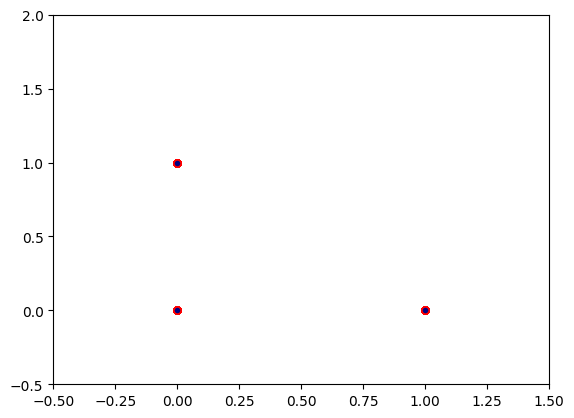

In [34]:
plot_predt(xgb_y_train.to_numpy(), y_predt, "multi")

In [49]:
# For categorical features, use these parameters:
# tree_method="gpu_hist" / enable_categorical=True  
# max_cat_to_onehot=5


xgbr = xgb.XGBRegressor(verbosity=1, base_score=0.5, booster='gbtree', 
       colsample_bynode=1, colsample_bytree=1, gamma=0, colsample_bylevel=1,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=5, objective='multi:softmax', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, enable_categorical=False, 
       max_cat_to_onehot=5, num_class=num_class, tree_method="gpu_hist") 

xgbr.fit(xgb_X_train, xgb_y_train, eval_set=[(xgb_X_dev, xgb_y_dev)])


number of classes: 15


XGBoostError: [17:45:24] ../include/xgboost/objective.h:98: multioutput is not supported by current objective function
Stack trace:
  [bt] (0) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2d1853) [0x7fc80a4d1853]
  [bt] (1) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2df66c) [0x7fc80a4df66c]
  [bt] (2) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2df8cd) [0x7fc80a4df8cd]
  [bt] (3) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2ec087) [0x7fc80a4ec087]
  [bt] (4) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(+0x2e02f8) [0x7fc80a4e02f8]
  [bt] (5) /home/elvis/.cache/pypoetry/virtualenvs/scia-crf-lf-OXAjte5Q-py3.10/lib/python3.10/site-packages/xgboost/lib/libxgboost.so(XGBoosterUpdateOneIter+0x70) [0x7fc80a33c5a0]
  [bt] (6) /lib/x86_64-linux-gnu/libffi.so.8(+0x7e2e) [0x7fc870651e2e]
  [bt] (7) /lib/x86_64-linux-gnu/libffi.so.8(+0x4493) [0x7fc87064e493]
  [bt] (8) /usr/lib/python3.10/lib-dynload/_ctypes.cpython-310-x86_64-linux-gnu.so(+0xa3e9) [0x7fc8706cc3e9]



### 1.2. Case of CRF model

In [ ]:
# Install python packages dependencies (if not already installed)
!pip3 install pandas python_crfsuite summarytools sklearn_crfsuite unidecode
!pip3 install iteration_utilities matplotlib